In [1]:
import os
import json
import time
import copy
import pandas as pd
import matplotlib.pyplot as plt
from PIL import Image
import random
from torch.utils.data import Dataset
from torchvision import transforms
import torchvision
import torch
import numpy as np
from tqdm.notebook import tqdm
from collections import defaultdict
from sklearn.metrics import roc_curve, auc
import warnings
warnings.filterwarnings('ignore')

In [2]:
torch.cuda.is_available()

True

In [3]:
dataset_folder = "./../../datasets/ball_pythons/"

In [4]:
main_folder_list = os.listdir(dataset_folder)
morph_folder_list = [f"{dataset_folder}{i}/" for i in main_folder_list if "%" not in i and "." not in i and "Pos" not in i]

In [5]:
morph_img_folder_dict = {}
for morph_folder in morph_folder_list:
    morph_img_folder_list = os.listdir(morph_folder)
    morph_img_folder_list = [f"{morph_folder}{i}/" for i in morph_img_folder_list]
    if len(morph_img_folder_list) > 50:
        morph_img_folder_dict[morph_folder.split("/")[-2]] = {"img_folders": morph_img_folder_list,
        "num_imgs": len(morph_img_folder_list)}

total imgs in dict: 11277 - 15 morphs


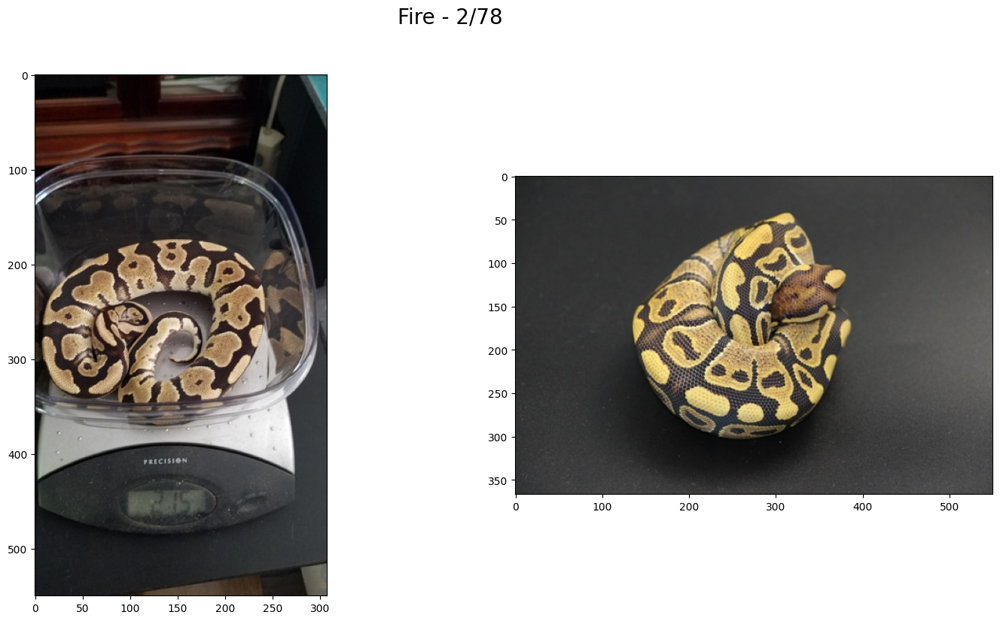

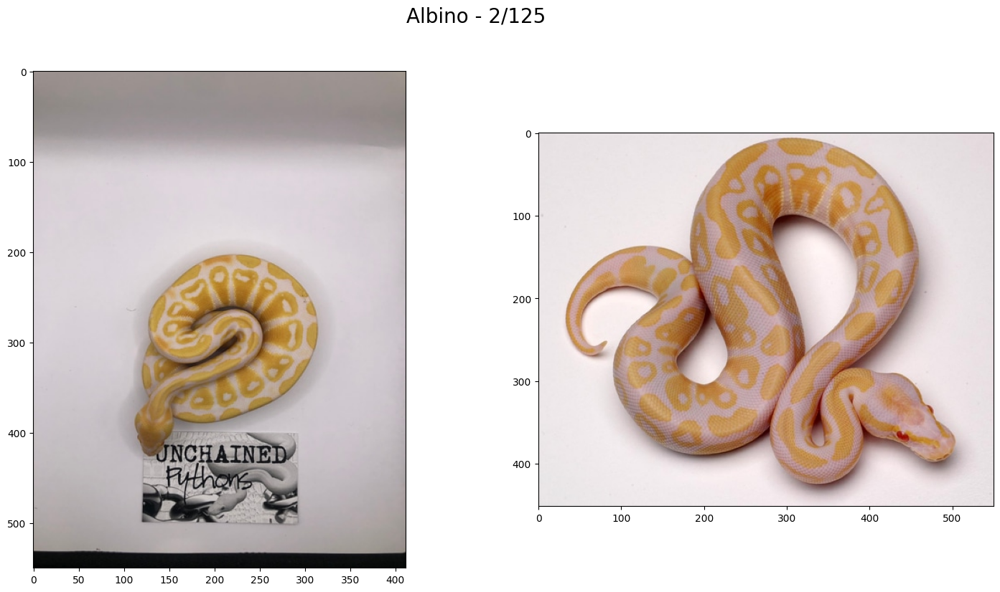

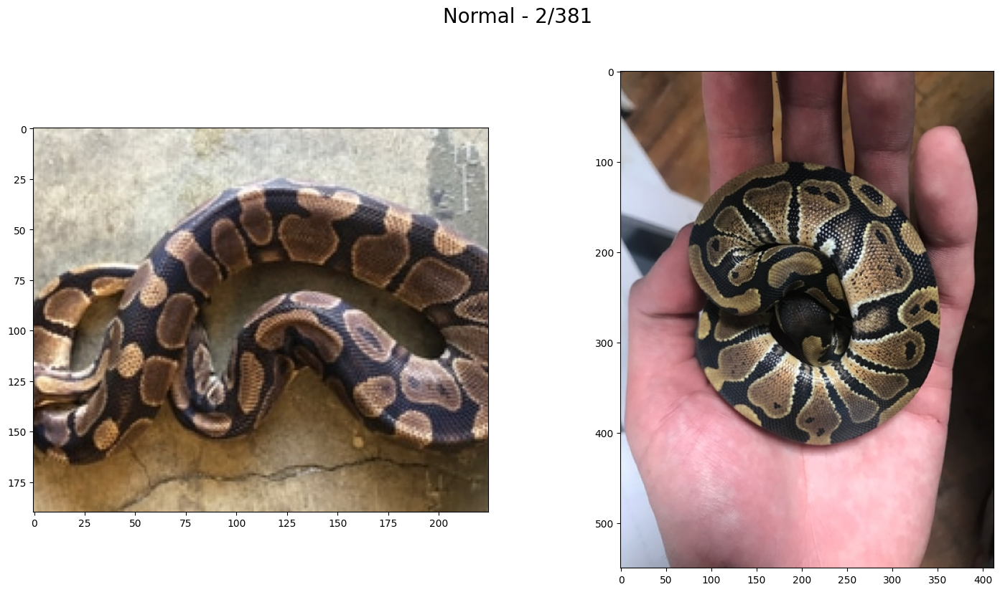

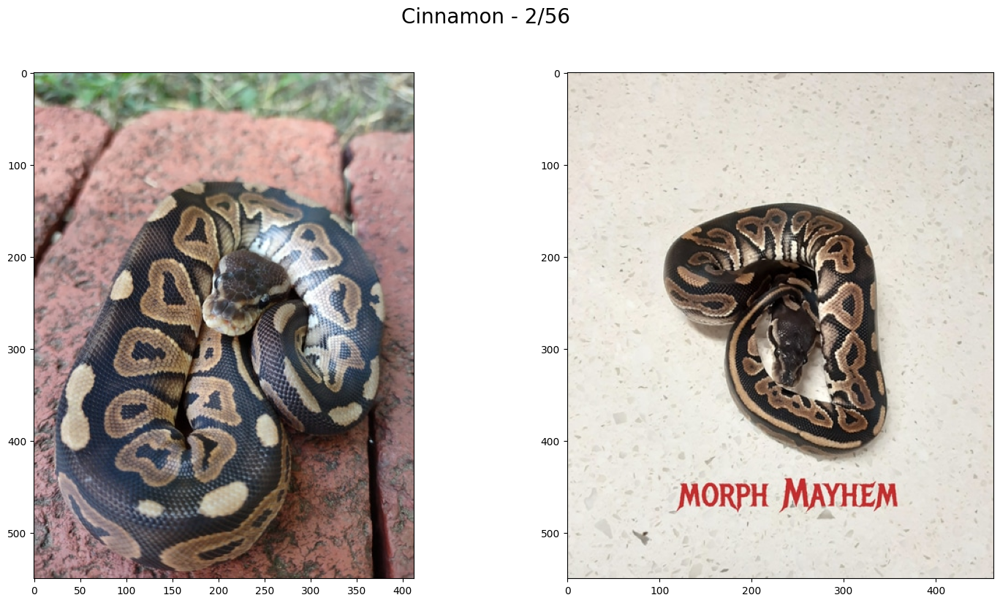

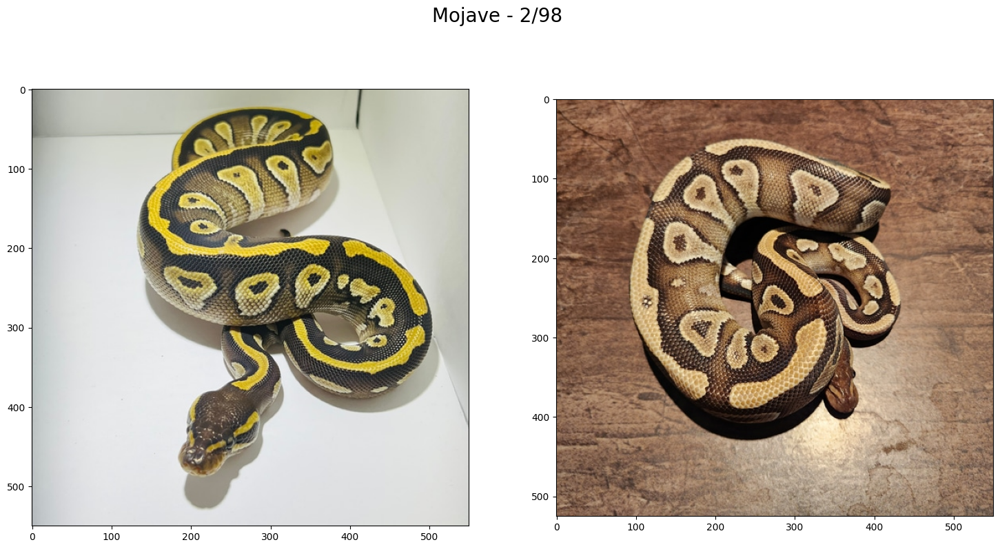

...

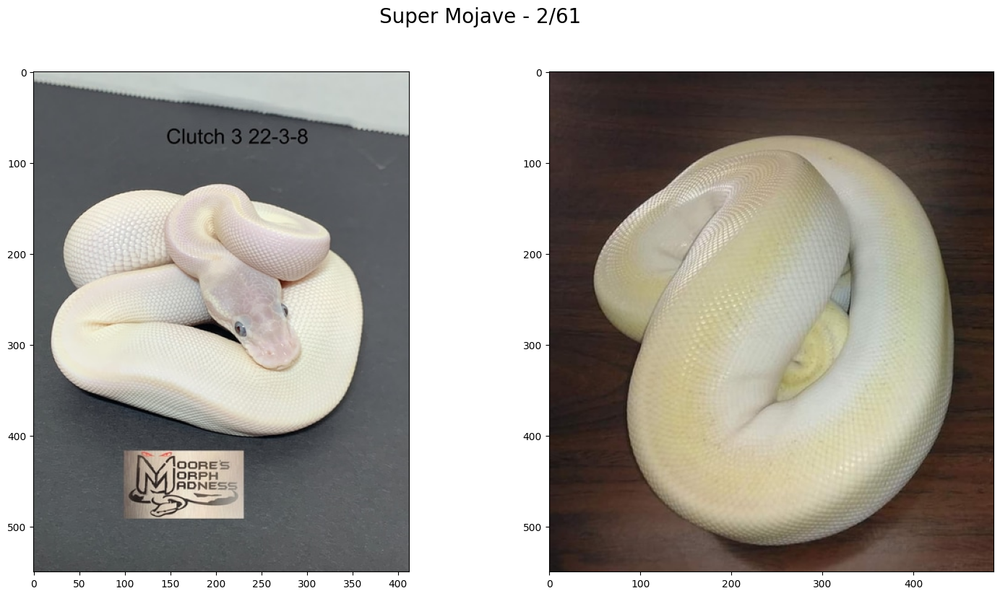

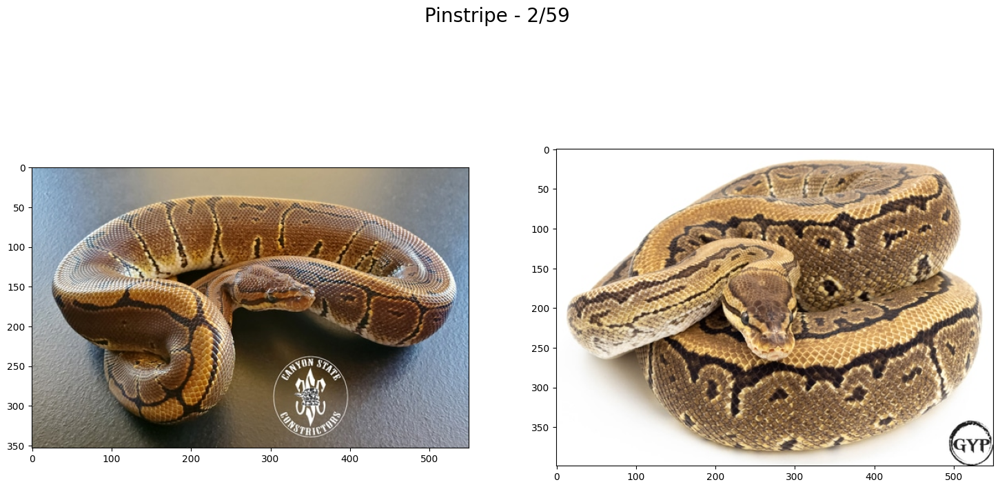

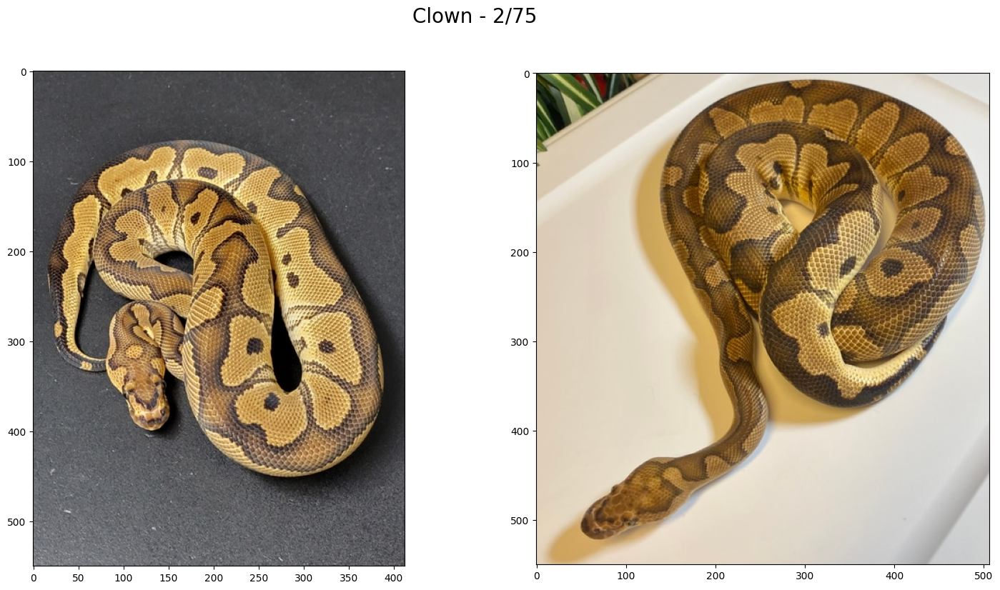

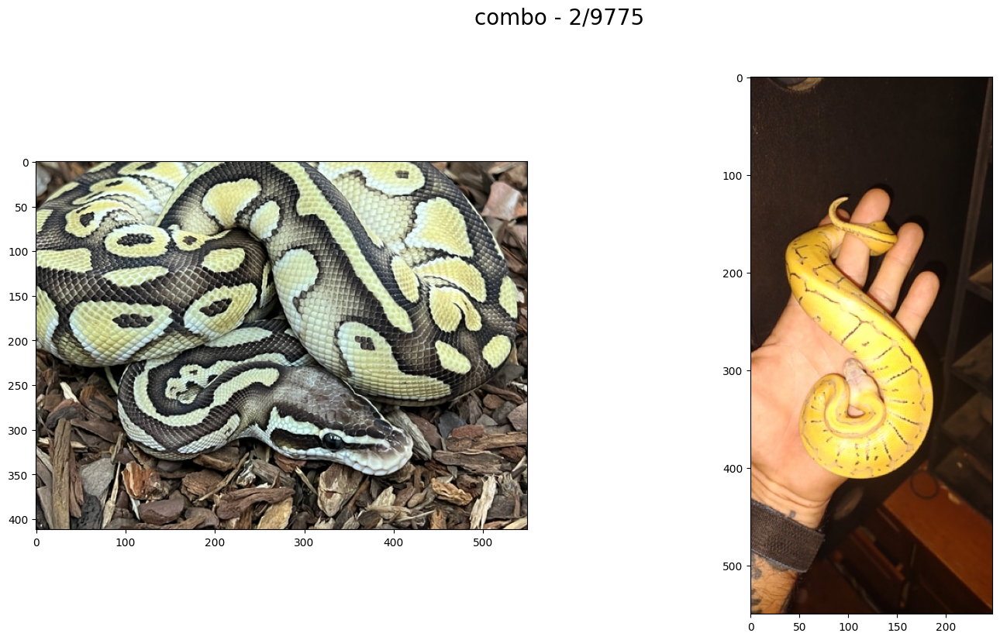

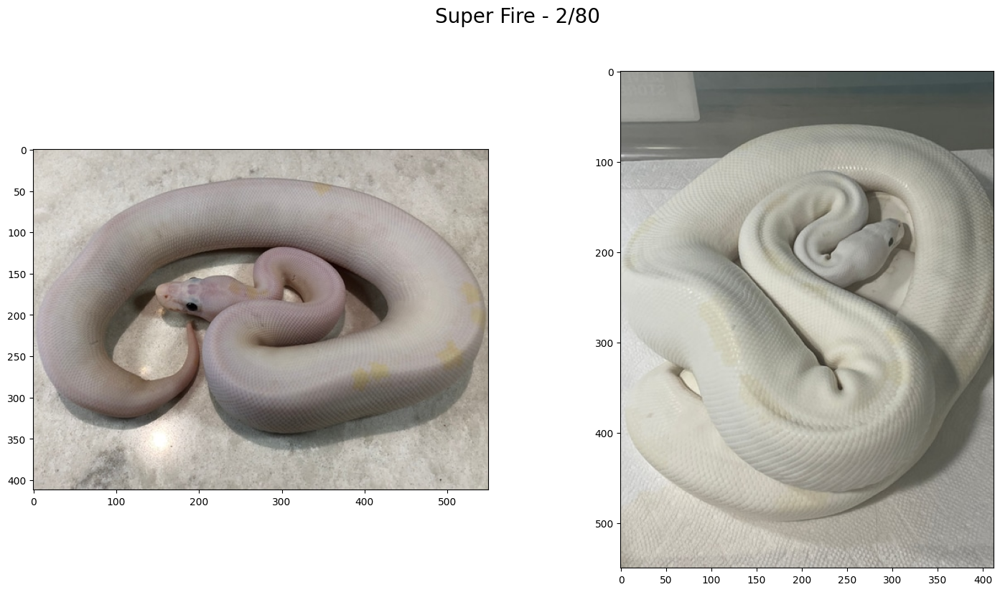

In [6]:
%matplotlib inline
total = 0
json_paths_list = []
for morph, morph_dict in morph_img_folder_dict.items():
    img_folder_list = morph_dict["img_folders"]
    image_paths = [[i+k for k in os.listdir(i) if k.endswith(".png")][0] for i in img_folder_list]
    json_paths = [[i+k for k in os.listdir(i) if k.endswith(".json")][0] for i in img_folder_list]
    json_paths_list.extend(json_paths)
    rand_samples = random.sample(image_paths,2)
    fig, ax = plt.subplots(ncols=2, figsize=(18,9))
    image = Image.open(rand_samples[0])
    ax[0].imshow(image)
    image = Image.open(rand_samples[1])
    ax[1].imshow(image)
    fig.suptitle(f"{morph} - 2/{morph_dict['num_imgs']}", fontsize=20)
    total += morph_dict["num_imgs"]
print(f"total imgs in dict: {total} - {len(morph_img_folder_dict)} morphs")

In [7]:
morph_details_dict = {}
all_image_details_dict = {}
for path in tqdm(json_paths_list):
    image_details_dict = {}
    cur_morph = path.split("/")[-3]
    if not morph_details_dict.get(cur_morph):
        morph_details_dict[cur_morph] = {}
    with open(path, "r") as f:
        image_details_dict = json.load(f)
        del image_details_dict["raw_details"]
    early_path = "/".join(path.split("/")[:-1])
    image_path = [f"{early_path}/{i}" for i in os.listdir(early_path) if not i.endswith(".json")][0]
    try:
        image = Image.open(image_path)
        image_details_dict["width"] = image.width
        image_details_dict["height"] = image.height
    except Exception as e:
        image_details_dict = {}
    if image_details_dict:
        morph_details_dict[cur_morph][image_path] = image_details_dict
        all_image_details_dict[image_path] = image_details_dict

  0%|          | 0/11277 [00:00<?, ?it/s]

In [8]:
metadata_df = pd.DataFrame.from_dict(all_image_details_dict, orient="index")
metadata_df = metadata_df.reset_index()
metadata_df = metadata_df.rename(columns={"index":"image_path"})

In [9]:
metadata_df.head()

,image_path,sex,traits,weight,price,width,height,dob,proven_breeder
0,./../../datasets/ball_pythons/Fire/Fire_bb1b7d...,female,[Fire],200g,US$125.00,550,540,NaN,NaN
1,./../../datasets/ball_pythons/Fire/Fire_fa9ffb...,male,[Fire],760g,US$100.00,412,550,2019,NaN
2,./../../datasets/ball_pythons/Fire/Fire_6703a0...,female,[Fire],1900g,US$500.00,412,550,July 2019,Yes
3,./../../datasets/ball_pythons/Fire/Fire_bf00f4...,female,[Fire],1644g,US$375.00,440,550,2016,Yes
4,./../../datasets/ball_pythons/Fire/Fire_b1ca68...,female,[Fire],NaN,US$85.00,550,413,2021,NaN


In [10]:
metadata_df.to_csv("./../../datasets/ball_pythons/dataset_metadata.csv", index=False)

In [11]:
test_df = pd.read_csv("./../../datasets/ball_pythons/dataset_metadata.csv")
test_df.head()

,image_path,sex,traits,weight,price,width,height,dob,proven_breeder
0,./../../datasets/ball_pythons/Fire/Fire_bb1b7d...,female,['Fire'],200g,US$125.00,550,540,NaN,NaN
1,./../../datasets/ball_pythons/Fire/Fire_fa9ffb...,male,['Fire'],760g,US$100.00,412,550,2019,NaN
2,./../../datasets/ball_pythons/Fire/Fire_6703a0...,female,['Fire'],1900g,US$500.00,412,550,July 2019,Yes
3,./../../datasets/ball_pythons/Fire/Fire_bf00f4...,female,['Fire'],1644g,US$375.00,440,550,2016,Yes
4,./../../datasets/ball_pythons/Fire/Fire_b1ca68...,female,['Fire'],NaN,US$85.00,550,413,2021,NaN


In [12]:
print(f"width - min: {metadata_df.width.min()} - median: {metadata_df.width.median()} - max: {metadata_df.width.max()}")
print(f"height - min: {metadata_df.height.min()} - median: {metadata_df.height.median()} - max: {metadata_df.height.max()}")

width - min: 155 - median: 550.0 - max: 550
height - min: 158 - median: 452.0 - max: 550


In [13]:
trait_list = []
for trait in metadata_df.traits.to_list():
    trait_list.extend(trait)

In [14]:
traits_dict = defaultdict(lambda: 0)
for trait in trait_list:
    traits_dict[trait] += 1

In [15]:
traits_dict = {k: v for k, v in sorted(traits_dict.items(), key=lambda item: item[1])}
traits_dict

{'Monarch': 1,
 '50% Het Moray': 1,
 'Smoke': 1,
 'Ajax': 1,
 'Alloy': 1,
 'Citron': 1,
 'Super Calico': 1,
 'Zuwadi': 1,
 '66% Het Monsoon': 1,
 'Mosaic': 1,
 '66% Het Orange Ghost': 1,
 'Black Belly': 1,
 'Super Phantom': 1,
 'Pos Het Caramel Albino': 1,
 'Super Bamboo': 1,
 'Super Spark': 1,
 '100% Het Axanthic (MJ)': 1,
 'Melt': 1,
 'Bling Yellow Belly': 1,
 'Super Nr Mandarin': 1,
 'Arcane': 1,
 'Axanthic (MJ)': 1,
 'Pos Het Moray': 1,
 'Marvel': 1,
 'Super Bongo': 1,
 'Satin': 1,
 'Super X-treme Gene': 1,
 '100% Het Axanthic (GCR)': 1,
 'KRG': 1,
 'Pastel Jungle': 1,
 'Jolt': 1,
 'Nyala': 1,
 'Cafe': 1,
 'Desert': 1,
 '100% Het Ghost (Vesper)': 1,
 'Super Scaleless Head': 1,
 '100% Het Green Ghost': 1,
 'Java': 1,
 'Paint': 1,
 'Super Cypress': 1,
 'Super Disco': 1,
 'Flare': 1,
 'Super Sapphire': 1,
 'Super Black': 1,
 'Lori': 1,
 'Super Asphalt': 2,
 'Super Sandblast': 2,
 '50% Het Monsoon': 2,
 'Pos Het Ghost (Vesper)': 2,
 '66% Het Tri-stripe': 2,
 'Super Red Stripe': 2,
 'Hy

In [16]:
filtered_traits = []
for trait, num in traits_dict.items():
    if '%' in trait and "100" not in trait:
        continue
    elif num >= 20:
        filtered_traits.append(trait)

In [17]:
class SquareCrop(object):
    def __init__(self):
        pass

    def __call__(self, tensor):
        longer_side = min(tensor.size)
        horizontal_padding = (longer_side - tensor.size[0]) / 2
        vertical_padding = (longer_side - tensor.size[1]) / 2
        cropped_tensor = tensor.crop((-horizontal_padding,
                        -vertical_padding,
                        tensor.size[0] + horizontal_padding,
                        tensor.size[1] + vertical_padding
                ))
        return cropped_tensor
    
    def __repr__(self):
        return self.__class__.__name__+'()'

In [18]:
def get_split(sample_array, split):
    np.random.seed(0)
    np.random.shuffle(sample_array)
    np.random.seed()
    if split == 'train':
        sample_array = sample_array[:int(len(sample_array)*0.7)]
    elif split == 'val':
        sample_array = sample_array[int(len(sample_array)*0.7):int(len(sample_array)*0.85)]
    elif split == 'test':
        sample_array = sample_array[int(len(sample_array)*0.85):]
    return list(sample_array)

In [19]:
def count_number_parameters(model):
    return sum(p.numel() for p in model.parameters() if p.requires_grad)

In [20]:
unique_traits = list(set(filtered_traits))
col_names = ["image_path"]
col_names.extend(unique_traits)
label_df = pd.DataFrame(columns=col_names)
# label_df = label_df.set_index("image_path")

In [21]:
label_df.head()

,image_path,100% Het Hypo,Female Maker,Cinnamon,Special,100% Het Clown,Gravel,Sandblast,100% Het Puzzle,Red Stripe,...,Super Yellow Belly,Spotnose,Axanthic (TSK),100% Het Ultramel,Calico,Pastel,Super Banana,Trick,Orange Dream,Super Pastel


In [22]:
# for ind, row in tqdm(metadata_df.iterrows(), total=len(metadata_df)):
#     label_row = [row['image_path']]
#     label_row.extend([1 if i in row['traits'] else 0 for i in unique_traits])
#     label_df.loc[len(label_df.index)] = label_row
# label_df.to_csv("./../../datasets/ball_pythons/label_data_filt_15_no_poss.csv", index=False)
label_df = pd.read_csv("./../../datasets/ball_pythons/label_data_filt_15_no_poss.csv")

  0%|          | 0/11261 [00:00<?, ?it/s]

In [23]:
label_df.sample(5)

,image_path,100% Het Hypo,Female Maker,Cinnamon,Special,100% Het Clown,Gravel,Sandblast,100% Het Puzzle,Red Stripe,...,Super Yellow Belly,Spotnose,Axanthic (TSK),100% Het Ultramel,Calico,Pastel,Super Banana,Trick,Orange Dream,Super Pastel
5205,./../../datasets/ball_pythons/combo/combo_ddc5...,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
8086,./../../datasets/ball_pythons/combo/combo_39cc...,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4267,./../../datasets/ball_pythons/combo/combo_40dd...,1,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,1,0,0
8696,./../../datasets/ball_pythons/combo/combo_c3d8...,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
7184,./../../datasets/ball_pythons/combo/combo_2318...,0,0,0,0,1,0,0,0,0,...,0,1,0,0,0,1,0,0,0,0


In [24]:
class BallPythonDataset(Dataset):
    ##### Initialize the class #####
    def __init__(self, dataset_df, possible_traits, split = 'train'):
        ## Split parameter is used to specify which process the data is used for,
        ## and it can be 'train', 'val', and 'test
        
        self.set_of_finding_labels = possible_traits
        
        ## Get the list of all patient ids present in the dataset and split into
        ## training, validation and testing by patient id, but not by list of examples
        image_paths = pd.unique(dataset_df.index)
        selected_paths = get_split(image_paths, split)

        sample_df = dataset_df.loc[selected_paths]      
        
        sample_df = sample_df[["image_path"] + self.set_of_finding_labels]

        self.image_list = sample_df['image_path'].values
        self.targets = sample_df[self.set_of_finding_labels].values
        
        ## Define data augmentation transformations for the input images. In this exercise, we use the following
        ## transformations: square center cropping, resizing to 224x224 (to be similar as ImageNet dataset), 
        ## converting to tensor, normalizing per channel (i.e., R, G, and B) 
        ## with the average and standard deviation of images in the ImageNet dataset        
        self.set_of_transforms = transforms.Compose(
        [SquareCrop(),
         transforms.Resize(228),
         transforms.ToTensor(), 
         transforms.Normalize(mean=[0.5, 0.5, 0.5],
                                 std=[0.5, 0.5, 0.5]),
        transforms.Resize(224)])
        
    ##### Retrieve a sample with the corresponding index #####
    ## This function retrieve a sample from the dataset at the specified index 
    ## and returns an image and the corresponding label stored in Pytorch tensors     
    def __getitem__(self, index):
        curr_pil_image = Image.open(self.image_list[index])
        image_to_return = self.set_of_transforms(curr_pil_image)
                
        return image_to_return, torch.FloatTensor(self.targets[index])
    
    ##### Get the length of the dataset #####tm
    def __len__(self):
        return len(self.image_list)
    
    ##### Access the name of conditions in the labels #####
    def get_labels_name(self):
        return self.set_of_finding_labels

In [25]:
train_dataset = BallPythonDataset(label_df, unique_traits)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

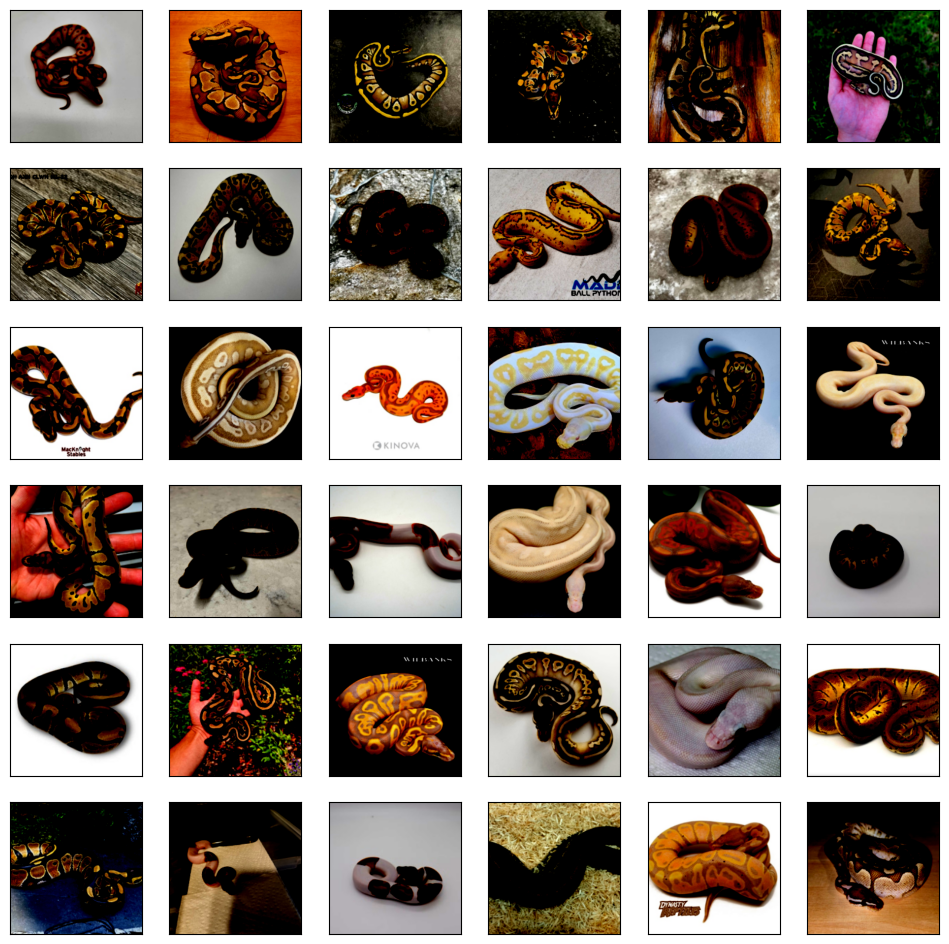

In [26]:
fig, ax = plt.subplots(ncols = 6, nrows = 6, figsize=(12,12))
j = 0
for i, rand_ind in enumerate(random.sample(list(range(len(train_dataset))), 36)):
    k = i % 6
    img, targ = train_dataset[rand_ind]
    ax[j,k].imshow(img.permute(1,2,0).detach())
    ax[j,k].set_xticks([])
    ax[j,k].set_yticks([])
    if k == 5:
        j += 1

In [27]:
trait_freq = np.sum(train_dataset.targets, axis=0)/len((train_dataset))
for i, trait_name in enumerate(unique_traits):
    print(f"{trait_name} - {round(trait_freq[i]*100, 4)}%")

100% Het Hypo - 4.9607%
Female Maker - 0.1776%
Cinnamon - 6.8384%
Special - 0.6724%
100% Het Clown - 11.4438%
Gravel - 0.6597%
Sandblast - 0.2411%
100% Het Puzzle - 0.609%
Red Stripe - 0.9896%
Pinstripe - 8.3481%
Spark - 0.203%
Super Orange Dream - 0.1903%
100% Het Lavender Albino - 0.9262%
Super Enchi - 0.7105%
Acid - 1.8777%
Confusion - 0.5202%
Red Gene - 0.1903%
Mojave - 9.3758%
100% Het Axanthic (VPI) - 3.4509%
Disco - 0.2157%
Blade - 0.3806%
Spider - 5.798%
Asphalt - 0.7232%
Black Head - 1.7508%
Desert Ghost - 1.256%
Paradox - 0.444%
Sugar - 0.3552%
Specter - 0.6344%
Het Red Axanthic - 0.6344%
Super Fire - 0.9262%
Russo - 0.3552%
Hurricane - 0.3045%
Fader - 0.1269%
Granite - 0.2791%
Hypo - 3.6666%
Genetic Stripe - 0.812%
Super Cinnamon - 0.2537%
Yellow Belly - 9.4012%
Stranger - 0.2157%
Banana - 12.7379%
Leopard - 8.4369%
Lace - 0.2284%
Bongo - 0.406%
100% Het Genetic Stripe - 0.7232%
GHI - 6.7496%
Cypress - 0.7866%
Enchi - 11.4311%
Woma - 0.3552%
Pos Het Clown - 0.7232%
Ultramel 

In [32]:
##### Request a GPU #####
## This function locates an available gpu for usage. In addition, this function reserves a specificed
## memory space exclusively for your account. The memory reservation prevents the decrement in computational
## speed when other users try to allocate memory on the same gpu in the shared systems, i.e., CADE machines. 
## Note: If you use your own system which has a GPU with less than 4GB of memory, remember to change the 
## specified mimimum memory.

# def define_gpu_to_use(minimum_memory_mb = 8000):    
#     thres_memory = 600 #
#     gpu_to_use = None
#     try: 
#         os.environ['CUDA_VISIBLE_DEVICES']
#         print('GPU already assigned before: ' + str(os.environ['CUDA_VISIBLE_DEVICES']))
#         return
#     except:
#         pass
    
#     torch.cuda.empty_cache()
#     for i in range(16):
#         free_memory = !nvidia-smi --query-gpu=memory.free -i $i --format=csv,nounits,noheader
#         if free_memory[0] == 'No devices were found':
#             break
#         free_memory = int(free_memory[0])
        
#         if free_memory>minimum_memory_mb-thres_memory:
#             gpu_to_use = i
#             break
            
#     if gpu_to_use is None:
#         print('Could not find any GPU available with the required free memory of ' + str(minimum_memory_mb) \
#               + 'MB. Please use a different system for this assignment.')
#     else:
#         os.environ['CUDA_VISIBLE_DEVICES'] = str(gpu_to_use)
#         print('Chosen GPU: ' + str(gpu_to_use) + f" with {free_memory}MB free")
#         x = torch.rand((256,1024,minimum_memory_mb-thres_memory)).cuda()
#         x = torch.rand((1,1)).cuda()        
#         del x
        
# ## Request a gpu and reserve the memory space
# define_gpu_to_use()

In [35]:
##### Calculate AUC metric #####
## This function compute AUC from the given input arrays i.e., predicted value and ground truth arrays
def auroc(logits_predicted, target):
    fpr, tpr, _ = roc_curve(target, logits_predicted)
    return auc(fpr, tpr)

##### Compute AUC of a given dataset #####
## This function takes a model and Pytorch data loader as input. 
## The given model is used to predict the expected label for each sample in the Pytorch data loader.
def get_score_model_auroc(model, data_loader):
    ## Toggle model to eval mode
    model.eval()
    
    ## Iterate through the dataset and perform inference for each sample.
    ## Store inference results and target labels for AUC computation 
    with torch.no_grad():
        
        logits_predicted = np.zeros([1, len(unique_traits)])
        targets = np.zeros([1, len(unique_traits)])
        ## Iterate through the dataset and perform inference for each sample.
        ## Store inference results and target labels for AUC computation  
        for image, target in data_loader:
            image = image.cuda()
            # image = image.unsqueeze(0)
            logit_predicted = model(image)
            logits_predicted = np.concatenate((logits_predicted, logit_predicted.cpu().detach().numpy())\
                                              , axis = 0)
            # target = target.unsqueeze(0)
            targets = np.concatenate((targets, target.cpu().detach().numpy()), axis = 0)
            
    ## Return a list of auc values in which each value corresponds to one of the traits
    return [auroc(logits_predicted[:,i], targets[:,i]) for i in range(len(unique_traits))]

In [29]:
train_dataset = BallPythonDataset(label_df, unique_traits, 'train')
val_dataset = BallPythonDataset(label_df, unique_traits, 'val')
test_dataset = BallPythonDataset(label_df, unique_traits, 'test')

train_loader = torch.utils.data.DataLoader(train_dataset, batch_size=24, num_workers=12)
val_loader = torch.utils.data.DataLoader(val_dataset, batch_size=24, num_workers=12)
test_loader = torch.utils.data.DataLoader(test_dataset, batch_size=24, num_workers=12)

In [30]:
resnet18_default_weights = torchvision.models.ResNet18_Weights.DEFAULT
resnet18_pretrain = torchvision.models.resnet18(weights=resnet18_default_weights, progress=False)
print("### resnet18 ###")
print(count_number_parameters(resnet18_pretrain))
# print(resnet18_pretrain)

resnet18_finetune = resnet18_pretrain
num_ftrs = resnet18_finetune.fc.in_features
resnet18_finetune.fc = torch.nn.Linear(num_ftrs, len(unique_traits))
print("### modified resnet18 ###")
print(count_number_parameters(resnet18_finetune))
resnet18_finetune = resnet18_finetune.cuda()
# print(resnet18_finetune)

### resnet18 ###
11689512
### modified resnet18 ###
11225760


In [31]:
# loss function - multilabel soft margin loss - images can have multiple correct labels and is similar to log-softmax
multi_label_loss = torch.nn.MultiLabelSoftMarginLoss()

In [32]:
test_results = get_score_model_auroc(resnet18_finetune, test_loader)

  0%|          | 0/71 [00:00<?, ?it/s]

In [33]:
real_results = 0
total_auc = 0
for k, trait in enumerate(test_dataset.get_labels_name()):
    if not np.isnan(test_results[k]):
        print(f"{trait} - {round(test_results[k],4)}")
        real_results += 1
        total_auc += test_results[k]
print(f"average auc ({real_results} traits): {total_auc/real_results}")

100% Het Hypo - 0.4659
Female Maker - 0.49
Cinnamon - 0.6126
Special - 0.3237
100% Het Clown - 0.5041
Gravel - 0.4384
Sandblast - 0.3987
100% Het Puzzle - 0.3341
Red Stripe - 0.4549
Pinstripe - 0.6115
Spark - 0.7619
Super Orange Dream - 0.3384
100% Het Lavender Albino - 0.4936
Super Enchi - 0.8953
Acid - 0.5549
Confusion - 0.5136
Red Gene - 0.263
Mojave - 0.5366
100% Het Axanthic (VPI) - 0.4964
Disco - 0.3547
Blade - 0.5334
Spider - 0.4767
Asphalt - 0.4551
Black Head - 0.4476
Desert Ghost - 0.4329
Paradox - 0.4279
Sugar - 0.3529
Specter - 0.3677
Het Red Axanthic - 0.4868
Super Fire - 0.2034
Russo - 0.5313
Hurricane - 0.5604
Fader - 0.7465
Granite - 0.4418
Hypo - 0.5251
Genetic Stripe - 0.4965
Super Cinnamon - 0.1399
Yellow Belly - 0.4727
Stranger - 0.0598
Banana - 0.4733
Leopard - 0.5898
Lace - 0.3903
Bongo - 0.7336
100% Het Genetic Stripe - 0.4357
GHI - 0.4051
Cypress - 0.7311
Enchi - 0.4306
Woma - 0.5642
Pos Het Clown - 0.4841
Ultramel - 0.5757
Chocolate - 0.713
Black Pastel - 0.5808

In [34]:
def average_auc(trait_aucs: list):
    """
    Because bad labels some NaNs and those need to be ignored
    """
    total_auc = real_labels = 0
    for trait_auc in trait_aucs:
        if not np.isnan(trait_auc):
            total_auc += trait_auc
            real_labels += 1
    
    return total_auc/real_labels


1 epochs at Learning Rate = 0.01 


Ep 0: Train Loss = 0.11340; Train Acc = 0.53773
Val Acc = 0.54011
Epoch 0 - time 36.2
total training time 36.4

1 epochs at Learning Rate = 0.005 


Ep 0: Train Loss = 0.11159; Train Acc = 0.56186
Val Acc = 0.56942
Epoch 0 - time 34.4
total training time 71.1

1 epochs at Learning Rate = 0.001 


Ep 0: Train Loss = 0.09963; Train Acc = 0.75841
Val Acc = 0.73942
Epoch 0 - time 37.2
total training time 108.6

1 epochs at Learning Rate = 0.0001 


Ep 0: Train Loss = 0.14549; Train Acc = 0.80587
Val Acc = 0.75285
Epoch 0 - time 36.2
total training time 145.1


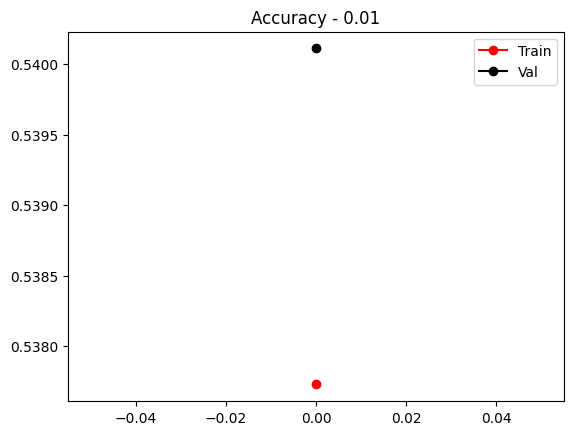

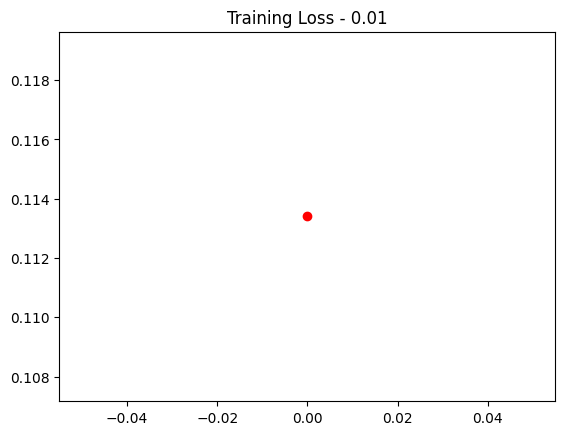

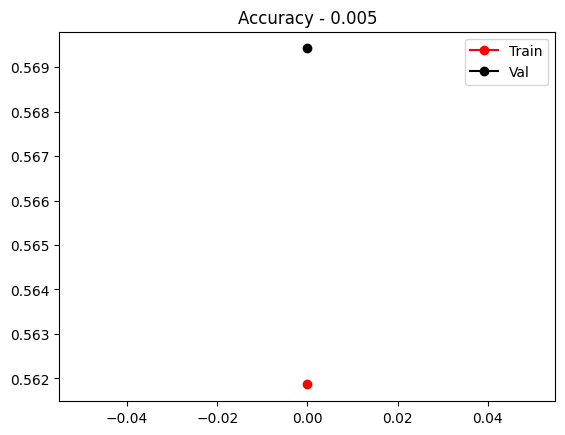

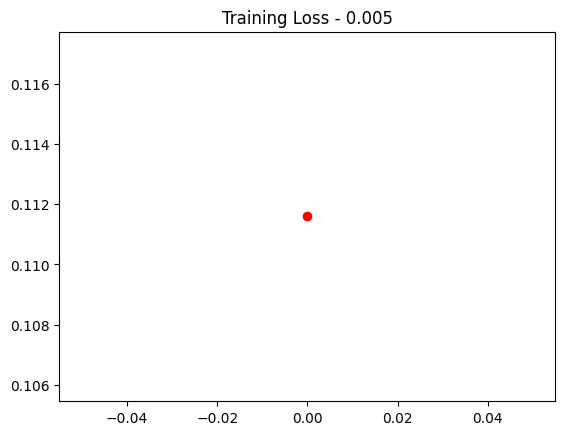

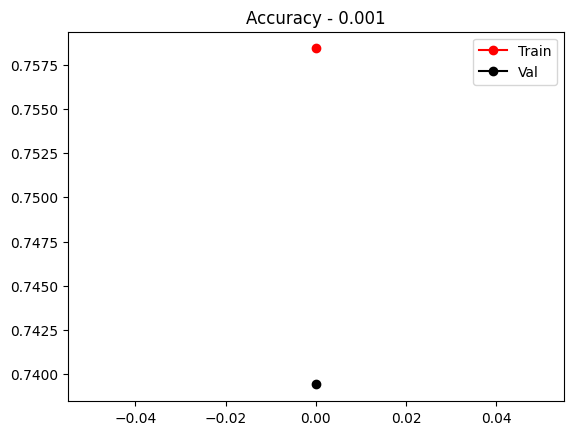

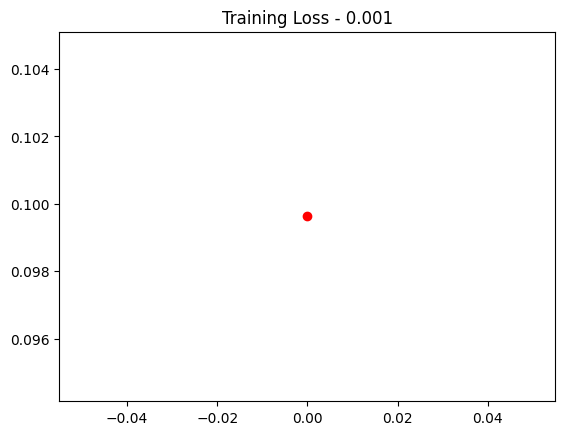

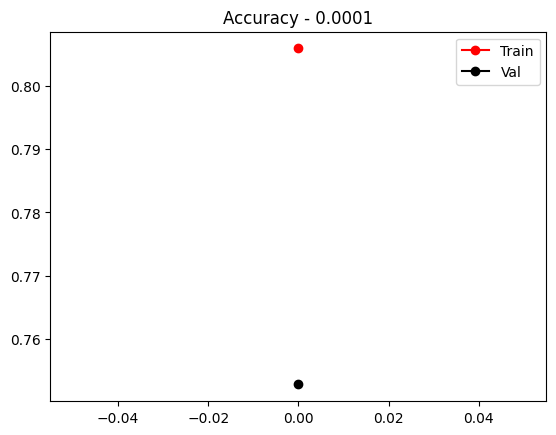

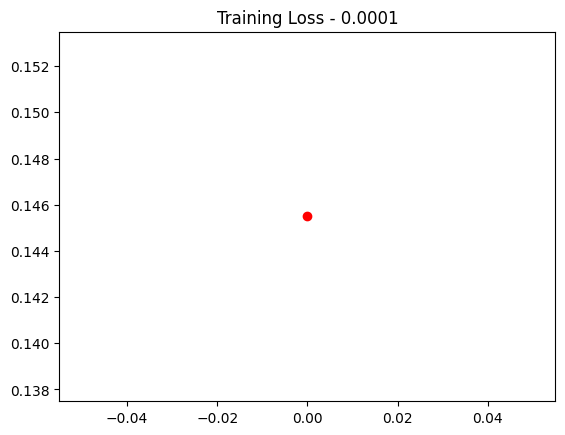

In [40]:
total_start = time.time()

train_loss_list = []
train_accuracy_list = []
val_accuracy_list = []
best_accuracy2 = 0.5
best_resnet18_finetune_list= []

for learn_rate in [0.01, 0.005, 0.001, 0.0001]:
    total_start = time.time()
    resnet18_default_weights = torchvision.models.ResNet18_Weights.DEFAULT
    resnet18_pretrain = torchvision.models.resnet18(weights=resnet18_default_weights, progress=False)
    resnet18_finetune = resnet18_pretrain
    num_ftrs = resnet18_finetune.fc.in_features
    resnet18_finetune.fc = torch.nn.Linear(num_ftrs, len(unique_traits))
    resnet18_finetune = resnet18_finetune.cuda()

    train_loss_list = []
    train_accuracy_list = []
    val_accuracy_list = []
    best_accuracy2 = 0.5
    best_resnet18_finetune_list= []

    optim2 = torch.optim.Adam(resnet18_finetune.parameters(),lr = learn_rate)
    epochs = 24
    print(f"\n{epochs} epochs at Learning Rate =", learn_rate,"\n\n")
    for epoch in range(epochs):
        epoch_start = time.time()
        running_loss = 0.0
        resnet18_finetune.train()
        for imgs, labels in train_loader:
            imgs = imgs.cuda()
            labels = labels.cuda()
            optim2.zero_grad()
            with torch.set_grad_enabled(True):
                outputs = resnet18_finetune(imgs)
                loss = multi_label_loss(outputs,labels)
                loss.backward()
                optim2.step()
            running_loss += (loss.item()*imgs.size(0))
        curr_ep_loss2 = running_loss/len(train_loader.dataset)
        curr_train_aucs = get_score_model_auroc(resnet18_finetune, train_loader)
        curr_train_accuracy2 = average_auc(curr_train_aucs)
        curr_val_aucs = get_score_model_auroc(resnet18_finetune, val_loader)
        curr_val_accuracy2 = average_auc(curr_val_aucs)
        print('Ep {:d}: Train Loss = {:.5f}; Train Acc = {:.5f}'.format(epoch,curr_ep_loss2,curr_train_accuracy2))
        print('Val Acc = {:.5f}'.format(curr_val_accuracy2))
        train_loss_list.append(curr_ep_loss2)
        train_accuracy_list.append(curr_train_accuracy2)
        val_accuracy_list.append(curr_val_accuracy2)

        if curr_val_accuracy2 > best_accuracy2:
                best_accuracy2 = curr_val_accuracy2
                best_resnet18_finetune_list.append(copy.deepcopy(resnet18_finetune))
                best_resnet18_finetune = best_resnet18_finetune_list[-1]
                torch.save(best_resnet18_finetune,f'./best_resnet18_finetune_{learn_rate}.pt')
        epoch_time = time.time()-epoch_start
        print('Epoch {:d} - time {:.1f}'.format(epoch,epoch_time))

    best_resnet18_finetune = best_resnet18_finetune_list[-1]
    total_time = time.time()-total_start
    print('total training time {:.1f}'.format(total_time))

    plt.figure()
    plt.plot(train_accuracy_list,'ro-',val_accuracy_list,'ko-')
    plt.legend(['Train','Val'])
    plt.title(f'Accuracy - {learn_rate}')

    plt.figure()
    plt.plot(train_loss_list,'ro-')
    plt.title(f'Training Loss - {learn_rate}')

In [81]:
top_model = torch.load('./best_resnet18_finetune1.pt')
test_results = get_score_model_auroc(top_model, test_loader)

real_results = 0
total_auc = 0
for k, trait in enumerate(test_dataset.get_labels_name()):
    if not np.isnan(test_results[k]):
        print(f"{trait} - total samples: {traits_dict[trait]} - {round(test_results[k],4)}")
        real_results += 1
        total_auc += test_results[k]
print(f"average auc ({real_results} traits): {total_auc/real_results}")

  0%|          | 0/71 [00:00<?, ?it/s]

50% Het Lavender Albino - total samples: 19 - 0.6157
66% Het Axanthic (VPI) - total samples: 46 - 0.4306
50% Het Desert Ghost - total samples: 51 - 0.556
Genetic Stripe - total samples: 90 - 0.9331
Jolliff Tiger - total samples: 18 - 0.8173
Sulfur - total samples: 15 - 0.7722
Pos Het Axanthic (TSK) - total samples: 12 - 0.7599
100% Het Toffee - total samples: 19 - 0.9305
Cypress - total samples: 76 - 0.8108
GHI - total samples: 768 - 0.8543
Blade - total samples: 46 - 0.6843
66% Het Puzzle - total samples: 11 - 0.932
Mahogany - total samples: 277 - 0.7359
66% Het Piebald - total samples: 98 - 0.6263
Trick - total samples: 34 - 0.5927
Super Orange Dream - total samples: 26 - 0.8875
Granite - total samples: 33 - 0.6362
Specter - total samples: 73 - 0.7469
50% Het Clown - total samples: 149 - 0.5569
50% Het Axanthic (VPI) - total samples: 38 - 0.5891
100% Het Piebald - total samples: 773 - 0.6758
Sable - total samples: 12 - 0.8114
Black Head - total samples: 182 - 0.777
Microscale - total